# Computer Vision - Object detection task

In this notebook, we will run an object detection model based on YOLOv8. The objective is to be able to differentiate between hat (category = 0), vests (category = 1) and workers (category = 2). 

## 1.1 Set up

In order to be able to run the model, first we need to set up the notebook. Let´s change the runtime accelarator into GPU. 

In [1]:
#Check that we are using GPU:
!nvidia-smi

Fri Feb  3 13:26:50 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 510.47.03    Driver Version: 510.47.03    CUDA Version: 11.6     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   63C    P0    29W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Now let´s import and install all the packages needed for the assigment.

In [2]:
# Installation of packages:
!pip install ultralytics
!pip install roboflow

# Importation of packages:
import os
from IPython import display
from ultralytics import YOLO
from IPython.display import display, Image
from roboflow import Roboflow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 271.6/271.6 KB 21.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.9/178.9 KB 23.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 78.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.6/140.6 KB 12.6 MB/s eta 0:00:00
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.24.3
    Uninstalling urllib3-1.24.3:
      Successfully uninstalled urllib3-1.24.3
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.0/49.0 KB 6.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 KB 8.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 KB 10.0 MB/s eta 0:00:00
  Created wheel for wget: filename=wget

We will create the variable HOME, which will be used in order to quickly access the folders were the datasets and the results are going to be saved.

In [3]:
HOME = os.getcwd()
print(HOME)

/content


Finally, let´s just establish some aspects of YOLO.

In [4]:
#display.clear_output()
!yolo checks

Ultralytics YOLOv8.0.26 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 23.6/166.8 GB disk)


# 1.2 Uploading the files from Roboflow

After merging the images and their respectives labels in Roboflow (and also solving manually some images for which the label did not existed), let´s upload all the training, validation and test datasets. 

In [5]:
# We go to Home:
%cd {HOME}

# Access to our datasets:
rf = Roboflow(api_key="nhUiqFLzEqIKUI8pj3L7")
project = rf.workspace("ie-university-jkanb").project("computer-vision-individual-assignment-v1")
dataset = project.version(2).download("yolov8")

/content
loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics<=8.0.20 is required but found version=8.0.26, to fix: `pip install ultralytics<=8.0.20`


Extracting Dataset Version Zip to Computer-Vision---Individual-Assignment-v1-2 in yolov8:: 100%|██████████| 3736/3736 [00:01<00:00, 2104.65it/s]


Finally, let´s create the directory **datasets** in order to save all the information there. This will help us to correctly access the data with YOLO.

In [6]:
# Creation of the directory datasets:
os.mkdir('datasets')

# Moving the downloaded folder from Roboflow into the new created directory:
!mv "Computer-Vision---Individual-Assignment-v1-2/" "datasets/"

# 1.3 Training the model

## 1.3.1 Baseline:
First, let´s establish a baseline model from which we should try to always improve. In this time, we will just train the model with 25 iterations (epochs) and a image size of 800 (re-scaled with Roboflow). Please also note that in Roboflow we created some augmentations, which could be of help in the object detection. The techniques used were:

- Flip
- Crop
- Saturation
- Brightness

In [7]:
%cd {HOME}

!yolo task=detect mode=train model=yolov8s.pt data=/content/datasets/Computer-Vision---Individual-Assignment-v1-2/data.yaml epochs=25 imgsz=800

/content
100% 21.5M/21.5M [00:01<00:00, 13.6MB/s]
Ultralytics YOLOv8.0.26 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/datasets/Computer-Vision---Individual-Assignment-v1-2/data.yaml, epochs=25, patience=50, batch=16, imgsz=800, save=True, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchsc

Let´s now analyze the results on train.

First, on the log of the model, we can see that our dataset is not balanced, especially for class 1 (vests). This will probably generate issues as, with so few examples, the model is going to struggle when trying to detect and categorize it. Even more, if we take into consideration that the vest is something used by each worker and the fact that this class is actually the one that appears the most, we should not be surprised if the model directly does not recognize the vest and just classify everything as a worker. 

Second, let's analyze the confusion matrix. From here we can observe that the model, in general, is struggling to detect all classes when they are in the image. For example, 31% of the time, the model does not recognize the hat. For the vest, this number increases to 50% (not surprising, given the fact explained in the above paragraph), and for workers, it fails 19% of the time. 

On the other hand, the model appears to be able to differentiate the classes from each other, as only 1% of the time, the model predicted worker when the actual class was hat.

Finally, the class for which the model is best predicting is obviously the workers. In most images, there is always a worker, and their size is higher than vests and hats.

In conclusion, we can summarize that the model is able to differentiate between classes correctly, but stills need to improve.

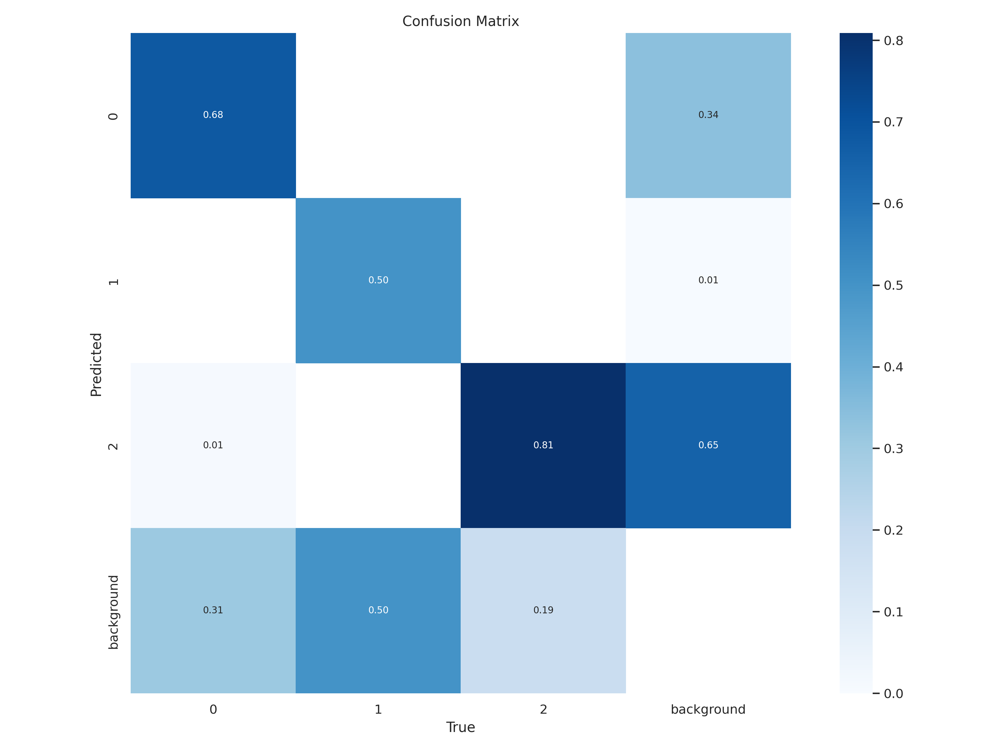

In [8]:
Image(filename=f'{HOME}/runs/detect/train/confusion_matrix.png', width=600)

Analyzing the graphs below, we can observe the following aspects:

- First, we could try running the model with more epochs. The box_loss function is not flattened at the end, meaning that the model detection can still improve. 

- On the other hand, we start to see a class loss more flattened at the end, meaning that maybe the model classification is not going to improve too much when we add more epochs. Let's find out in the next model.

- Looking at the MAP 50, we can see that on each iteration, the model has improved its capacity to correctly predict the first 50 detections. Something similar happens with the MAP 50-95.

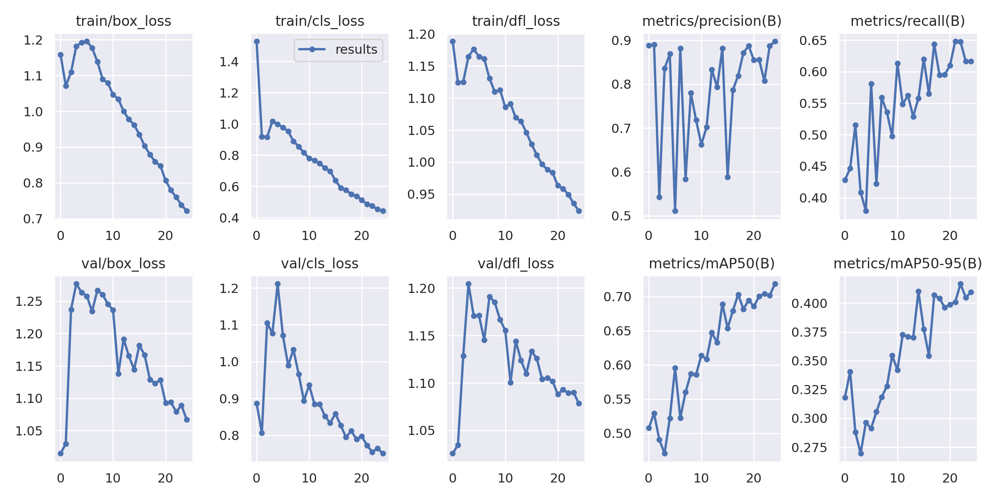

In [9]:
Image(filename=f'{HOME}/runs/detect/train/results.png', width=600)

Let's see some examples of how this model is detecting and classifying. 

We can observe that the model correctly predicts the workers, in most cases. The same thing appears to happen with the hat. Nevertheless, there is still plenty of room to improve. Take the second image of the last row as an example. In that case, the model correctly detects and classifies the hat, but the worker is not detected.

/content


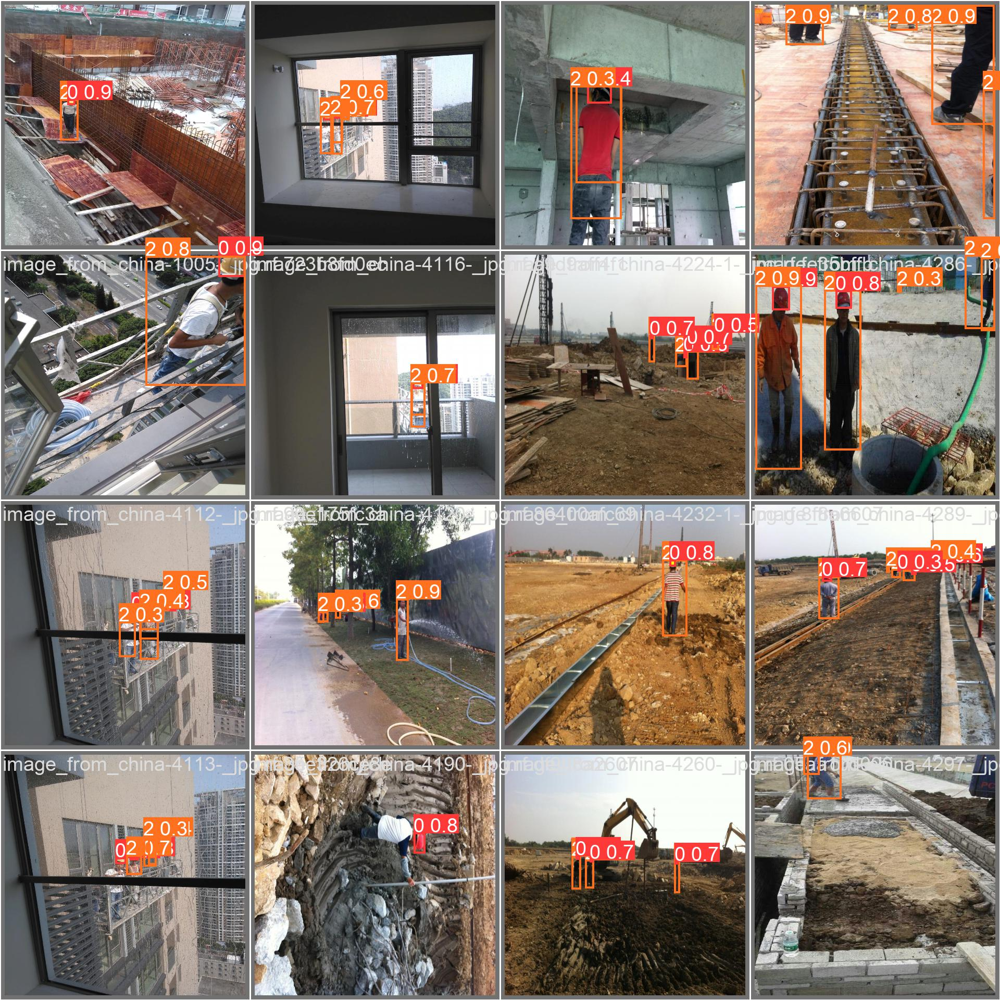

In [10]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/val_batch0_pred.jpg', width=600)

/content


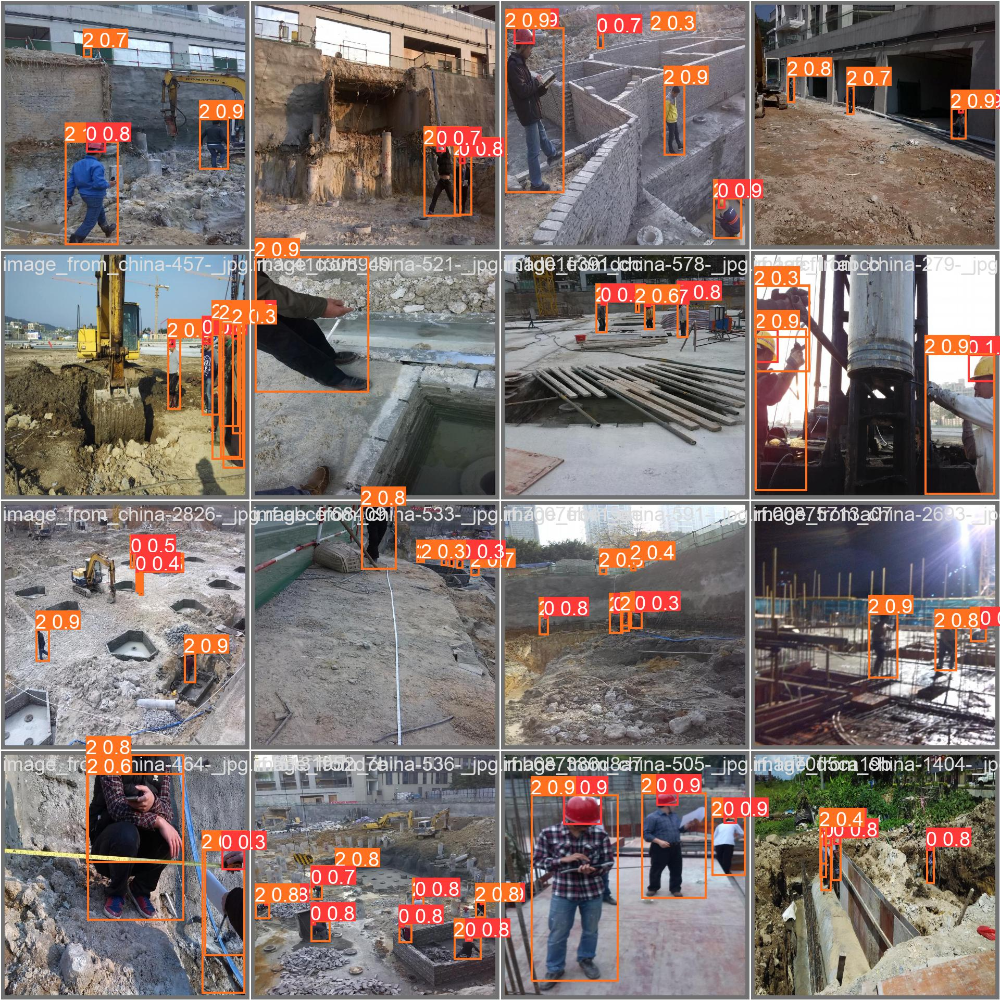

In [11]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/val_batch2_pred.jpg', width=600)

## 1.3.2 Second Model

Now let's run the model with more epochs to see if we can optimize even more the model.

In [12]:
%cd {HOME}
!yolo task=detect mode=train model=yolov8s.pt data=/content/datasets/Computer-Vision---Individual-Assignment-v1-2/data.yaml epochs=40 imgsz=800

/content
Ultralytics YOLOv8.0.26 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/datasets/Computer-Vision---Individual-Assignment-v1-2/data.yaml, epochs=40, patience=50, batch=16, imgsz=800, save=True, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8=F

Looking at the confusion matrix, we don´t find any improvement in the classification. In addition, the model stills tends to not classify objects when they appear in the image. This happens in the 31% of the times for class 0, 50% of the times for class 1 and only 20% of the times for class 2.

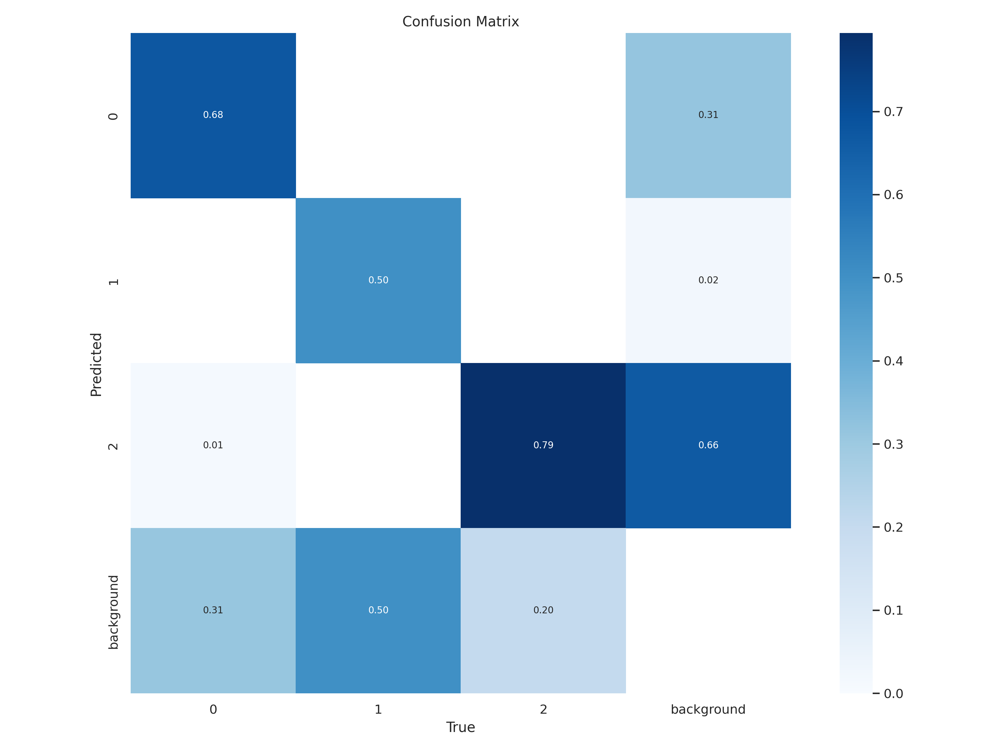

In [13]:
Image(filename=f'{HOME}/runs/detect/train2/confusion_matrix.png', width=600)

Looking at the below graph, we see that there is still space for running a model with more epochs. Both in the box_loss and classification loss, we do not find yet a plane graph, meaning that with the addition of more epochs, the model is not improving its performance. 

Regarding MAP50, we do not see any improvement here. Apparently, the addition of more epochs did not lead to better precision. In the case of MAP50-95, we can observe an increment, meaning that the model appears to be able to detect objects accurately and precisely, regardless of the size or aspect ratio of the objects in the image.

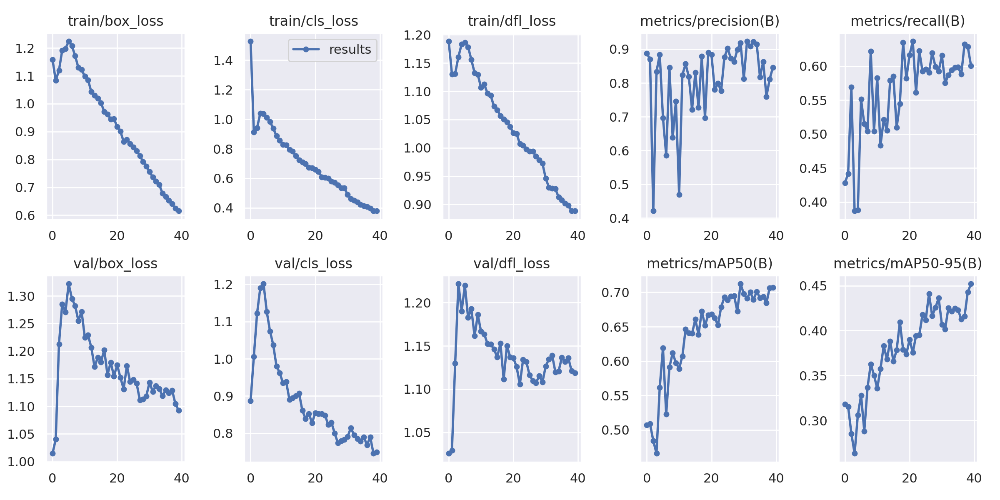

In [14]:
Image(filename=f'{HOME}/runs/detect/train2/results.png', width=600)

When analyzing the below image, we can see how the increment of epochs lead to a slightly better result. For the second picture of the last row, the worker now is recognized by the model. Saddly, the hat is not longer recognized here.

/content


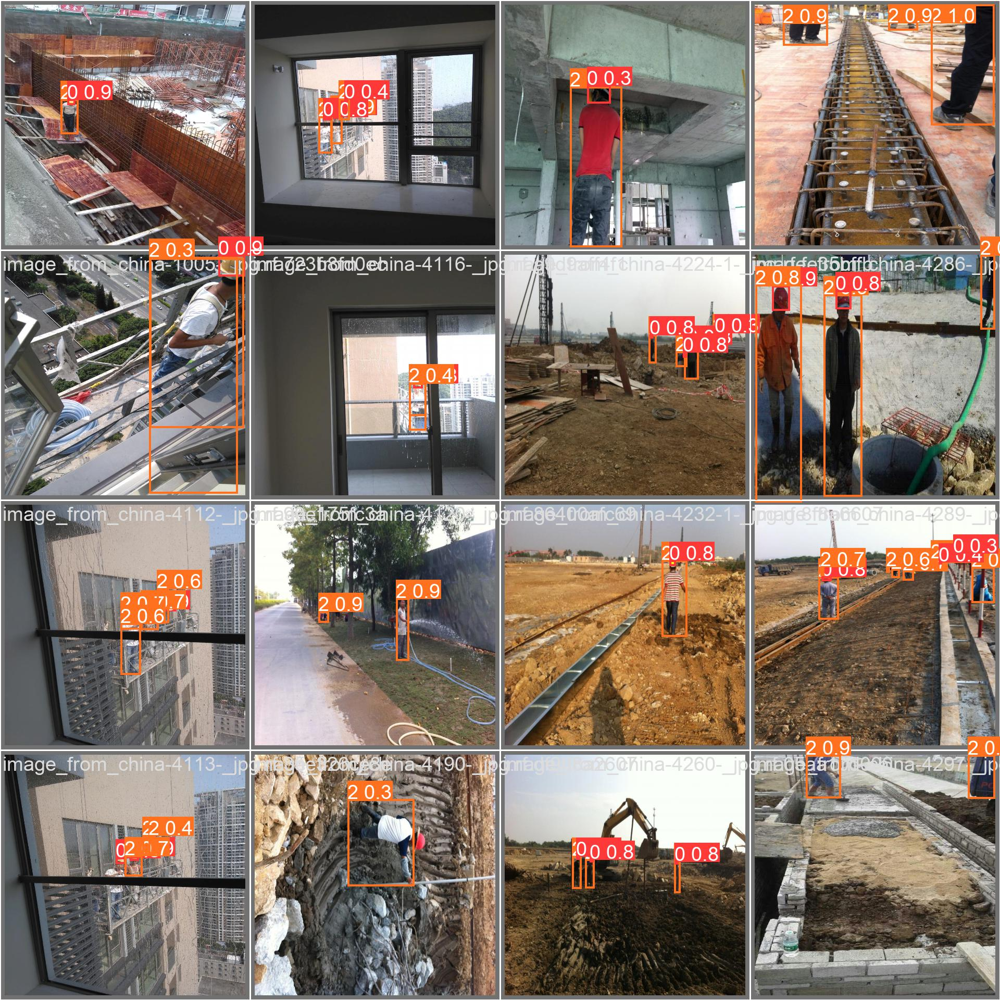

In [15]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train2/val_batch0_pred.jpg', width=600)

In the second image, we can find some slightly improvements on the detection. Take the first image of the last row, for example. The previous model was detecting and classifying a hand as a hat. This no longer happens. Looks like the model, with more epochs, now is able to predict a bit better the workers. Nevertheless, at the same time, the confusion matrix did not improved for class 2.

In conclusion, we consider the model is not improving with more epochs. Altough on some cases the detection seems to be improving, we need to find another way if we want to detect and classify better.

/content


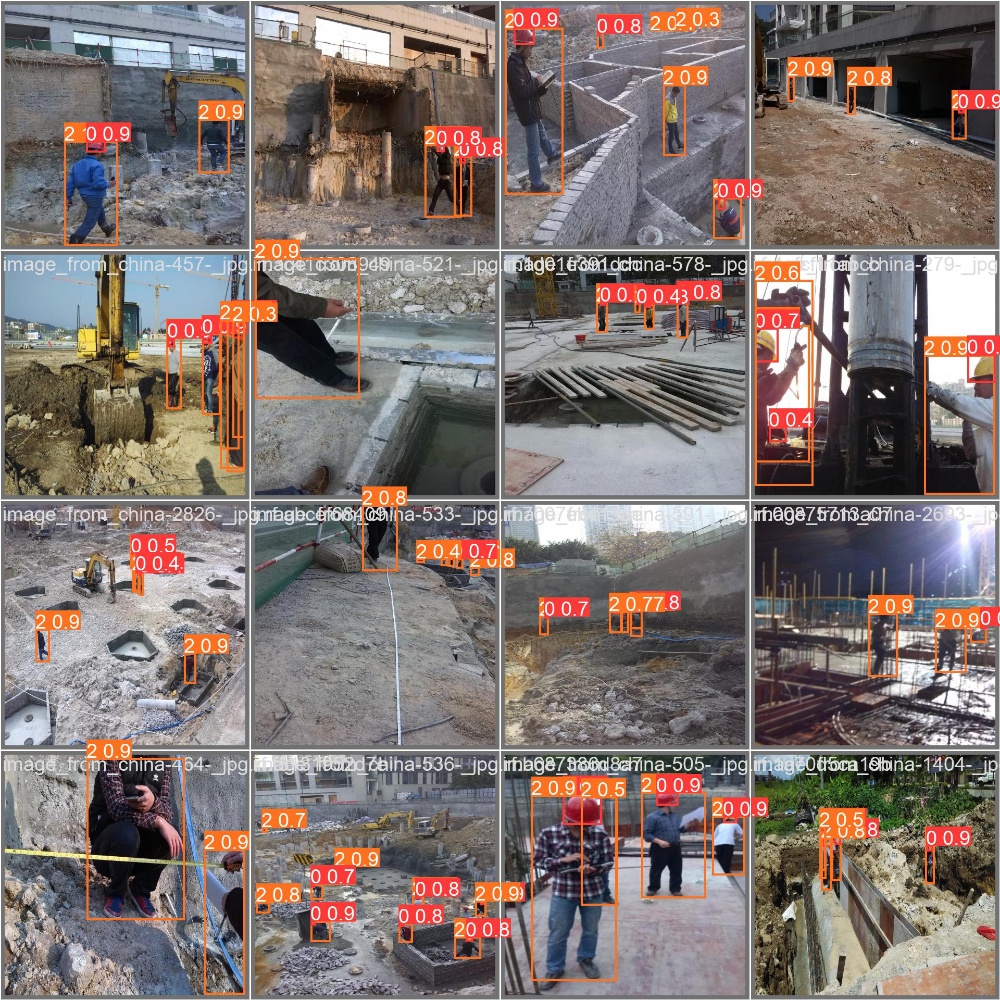

In [16]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train2/val_batch2_pred.jpg', width=600)

## 1.3.3 Third model

For the third model, we are going to introduce a new hyperparameter: the learning rate. This hyperparameter will establish the step size at which the optimizer updates the model parameters during training. A high learning rate can lead to a rapid convergence, at the cost of an increased risk of overshooting the optimal solution. A low learning rate, on the other hand, can result in a slow convergence but improve stability and accuracy at the same time. 

In our case, we will try the model with a more or less standard learning rate equal to 0.001. At the same time, let´s increase again the epochs. Although the previous model showed that this was not generating significant improvements, we consider that the not flattened curves for box_loss indicate that we should aggregate more epochs.

In [17]:
%cd {HOME}

!yolo task=detect mode=train model=yolov8s.pt data=/content/datasets/Computer-Vision---Individual-Assignment-v1-2/data.yaml epochs=60 imgsz=800 lr0 = 0.001

/content
Ultralytics YOLOv8.0.26 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/datasets/Computer-Vision---Individual-Assignment-v1-2/data.yaml, epochs=60, patience=50, batch=16, imgsz=800, save=True, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8=F

Looking at the confusion matrix, we can appreaciate an improvement, especially in the case on the classification of the workers (class 2). 

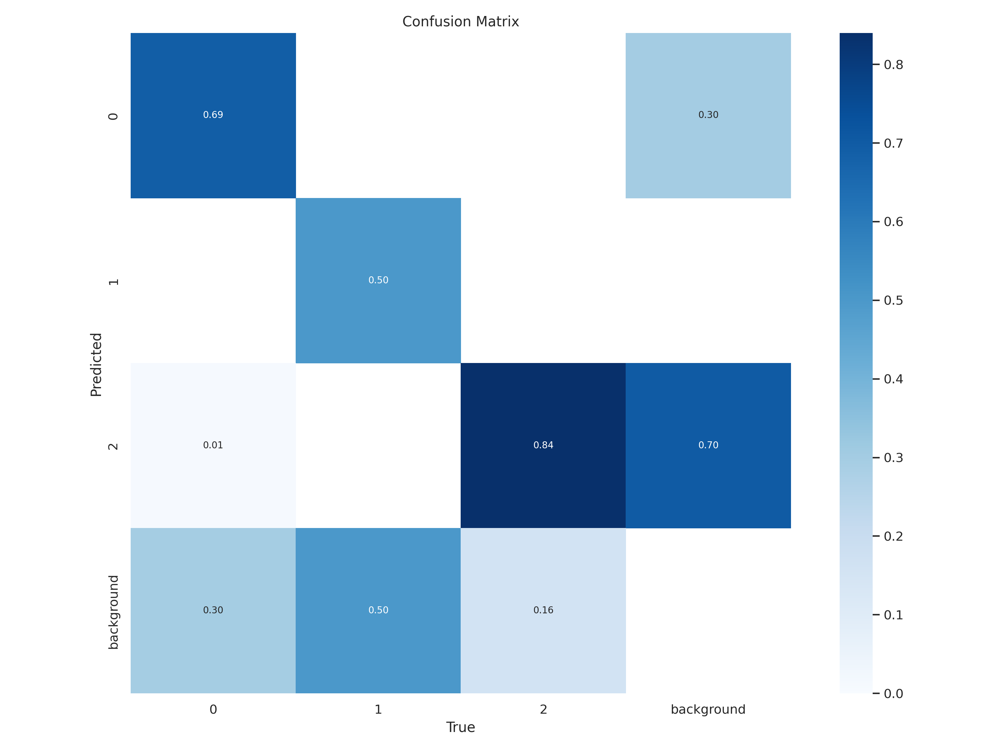

In [18]:
Image(filename=f'{HOME}/runs/detect/train3/confusion_matrix.png', width=600)

Now we are starting to appreciate a flattened graph when having more epochs, espcially in classification loss. Now we consider that adding more epochs will not generate better results.

Regarding MAP50 and MAP50-95, we do not find major improvements. Appears that the precision is reaching a maximum.

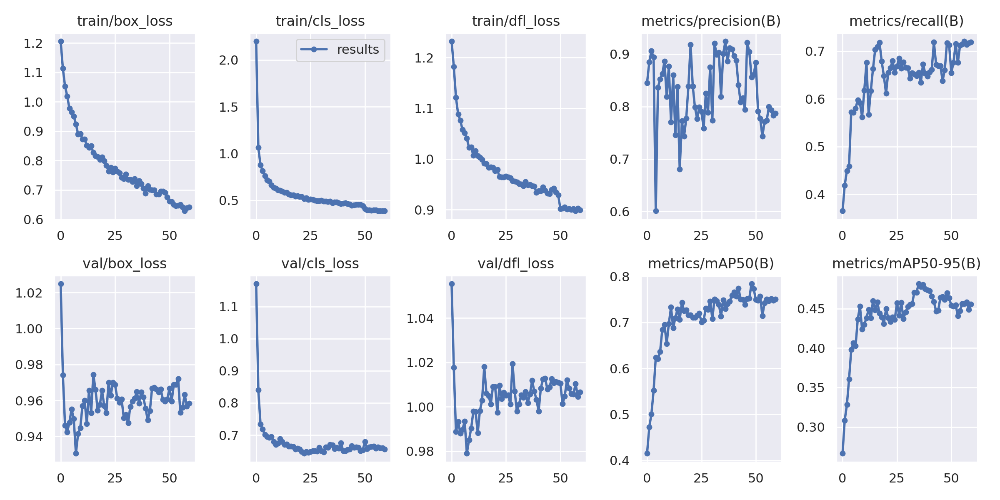

In [19]:
Image(filename=f'{HOME}/runs/detect/train3/results.png', width=600)

Taking the below image, again we can find an improvement. For example, for the second image of the last row, the model now is able to identify the worker and the hat, with quite a high confidence (0.9 and 0.8 for each case). This is the first model that is able to do it. 

/content


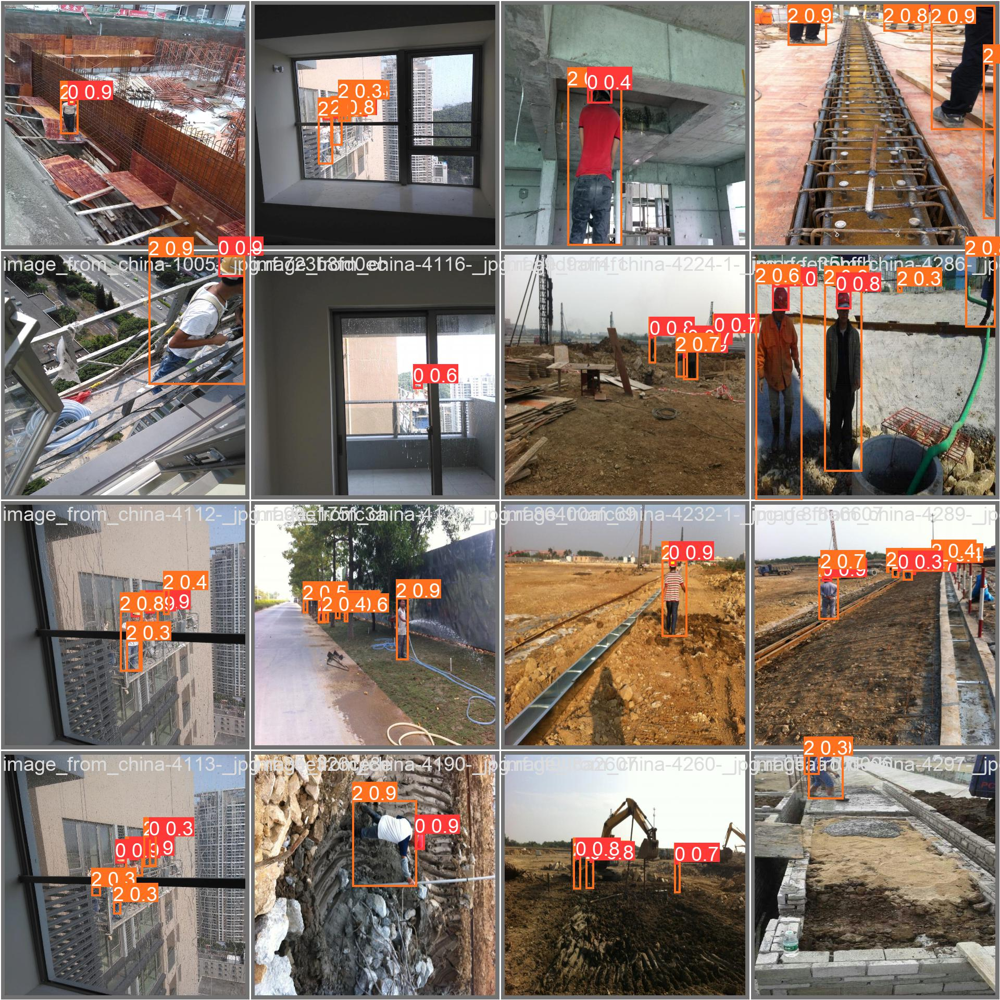

In [20]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train3/val_batch0_pred.jpg', width=600)

Regarding this other image, again we see an improvement in the detection and classification. For the first image in the second row, for example, not the model is able to even detect the worker in the machine, and with good confidence: 0.4. Considering that we are going to predict using a confidence of 0.25, if that image was on the test, the model will have detected and classified correctly.

This is going to be our final model.

/content


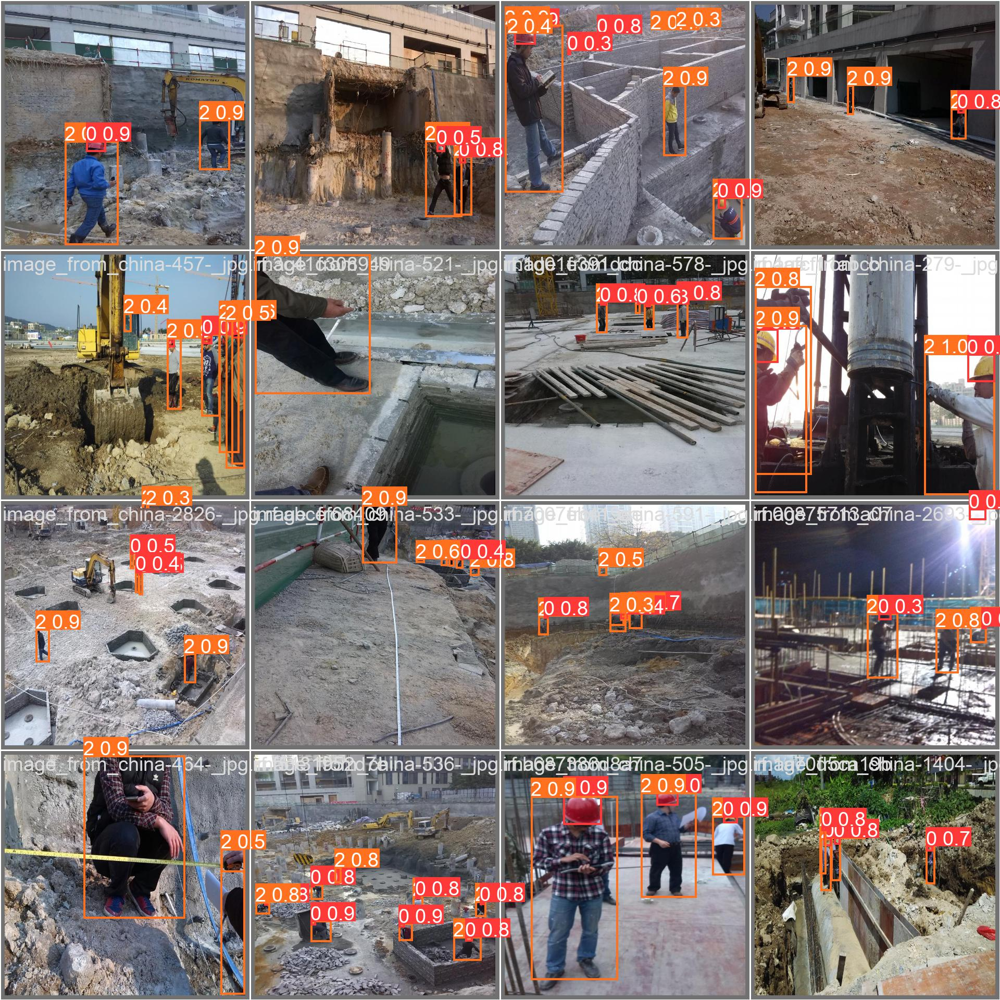

In [21]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train3/val_batch2_pred.jpg', width=600)

# 1.4 Prediction on test

Now that we have choosed our final model, let's run the best model and predict on the test data set.

In [22]:
%cd {HOME}

!yolo task=detect mode=val model={HOME}/runs/detect/train3/weights/best.pt data=datasets/Computer-Vision---Individual-Assignment-v1-2/data.yaml

/content
Ultralytics YOLOv8.0.26 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
Model summary (fused): 168 layers, 11126745 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/datasets/Computer-Vision---Individual-Assignment-v1-2/valid/labels.cache... 153 images, 0 backgrounds, 0 corrupt: 100% 153/153 [00:00<?, ?it/s]
val: WARNING ⚠️ /content/datasets/Computer-Vision---Individual-Assignment-v1-2/valid/images/image_from_china-2426-_jpg.rf.b7bfa11a1c77e0b0dbde2ac2144242ae.jpg: 1 duplicate labels removed
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 10/10 [00:05<00:00,  1.77it/s]
                   all        153        944       0.86      0.646      0.711      0.433
                     0        153        386      0.794      0.609      0.671      0.421
                     1        153          8      0.975        0.5      0.604      0.269
                     2        153        550      0.812      0.831      0.85

In [23]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train3/weights/best.pt conf=0.25 source=datasets/Computer-Vision---Individual-Assignment-v1-2/test/images

/content
Ultralytics YOLOv8.0.26 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
Model summary (fused): 168 layers, 11126745 parameters, 0 gradients, 28.4 GFLOPs

image 1/77 /content/datasets/Computer-Vision---Individual-Assignment-v1-2/test/images/image_from_china-1-_jpg.rf.0e4db3a298c2829765c304c01b420653.jpg: 640x640 1 0, 1 2, 17.1ms
image 2/77 /content/datasets/Computer-Vision---Individual-Assignment-v1-2/test/images/image_from_china-1017-_jpg.rf.90fcd511b45bd131df7a05683d875a14.jpg: 640x640 5 0s, 12 2s, 17.1ms
image 3/77 /content/datasets/Computer-Vision---Individual-Assignment-v1-2/test/images/image_from_china-1067-_jpg.rf.1711fb32d2d037ca0bd246038372a578.jpg: 640x640 1 0, 1 2, 17.1ms
image 4/77 /content/datasets/Computer-Vision---Individual-Assignment-v1-2/test/images/image_from_china-1195-_jpg.rf.fa3d3fbcc89b4644ec78d8afc1109a64.jpg: 640x640 5 0s, 5 2s, 17.1ms
image 5/77 /content/datasets/Computer-Vision---Individual-Assignment-v1-2/test/images/image_from_china-1

Let´s see how the model behaves on the below images for the test dataset.

We can observe that for most of them, the model behaves quite well. Only in the last image, we can see a worker and a hat that was not identified.

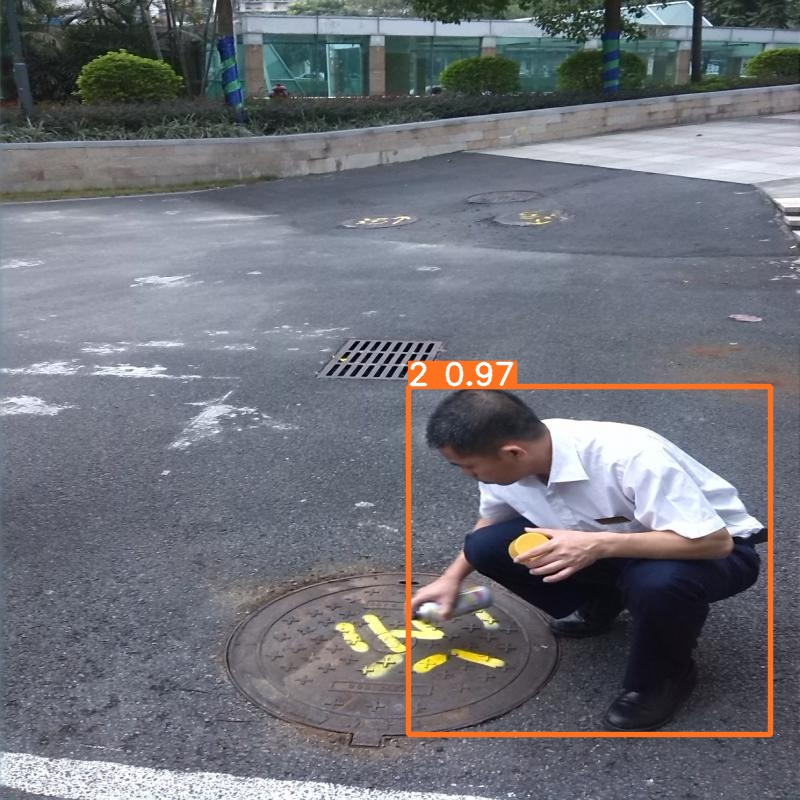

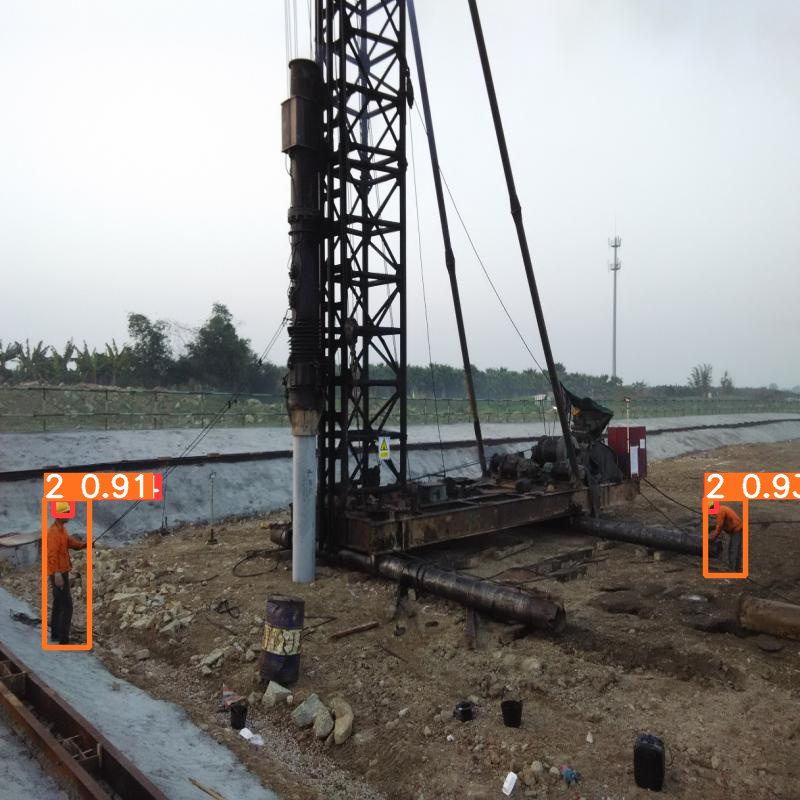

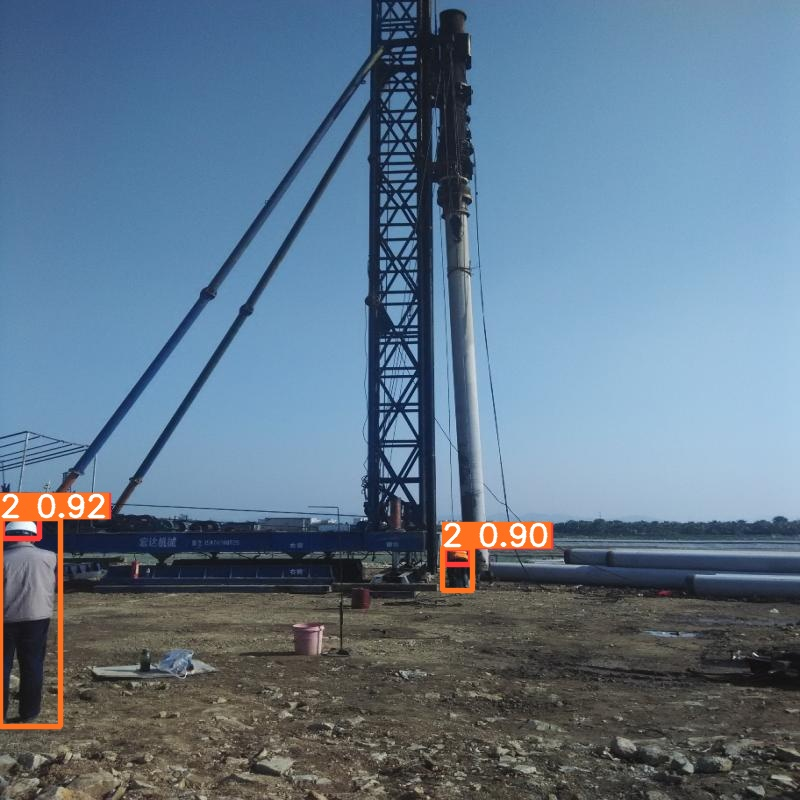

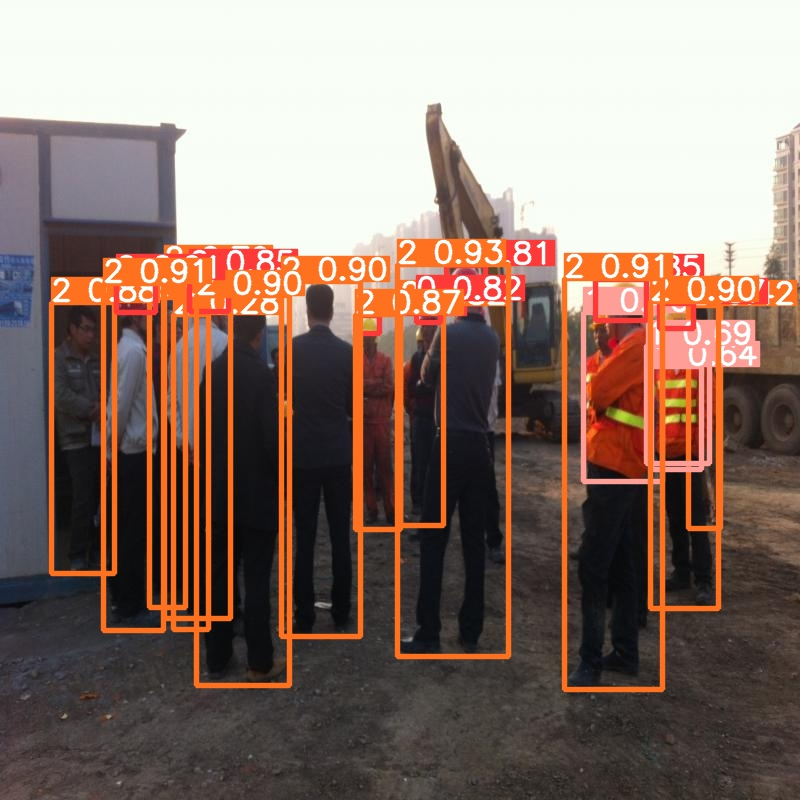

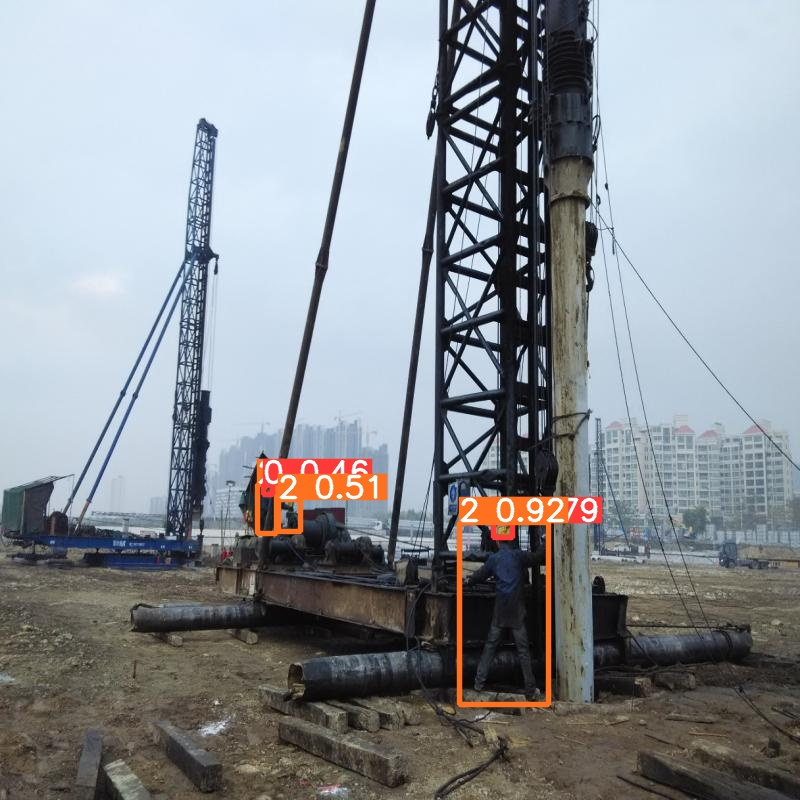

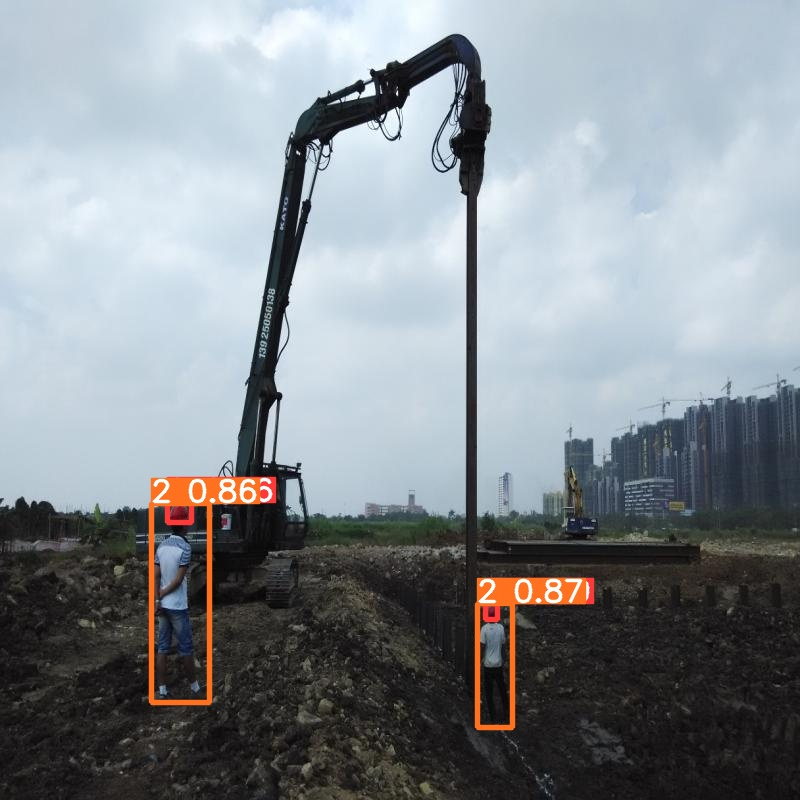

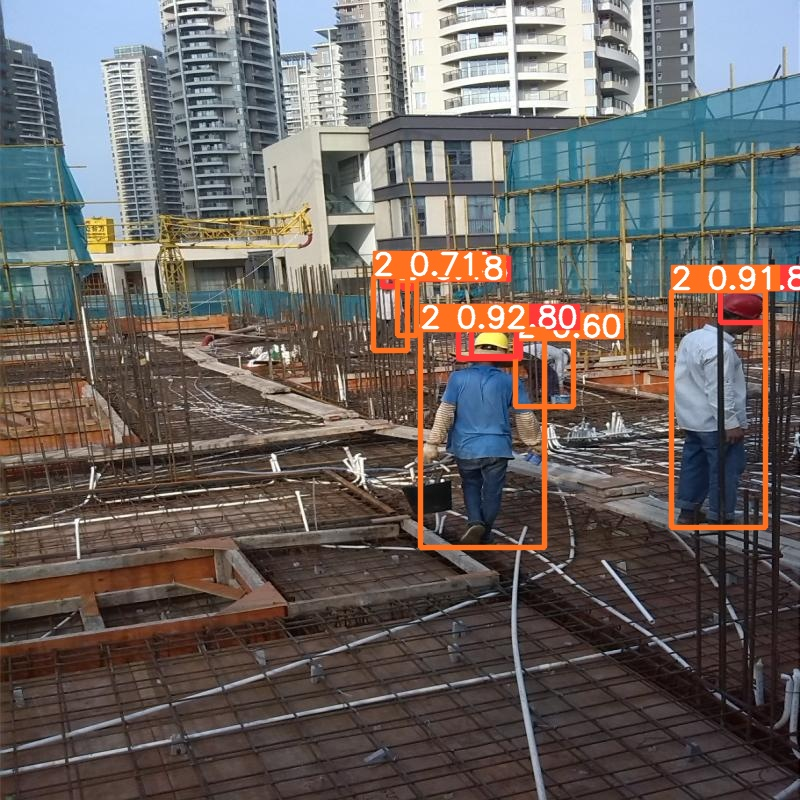

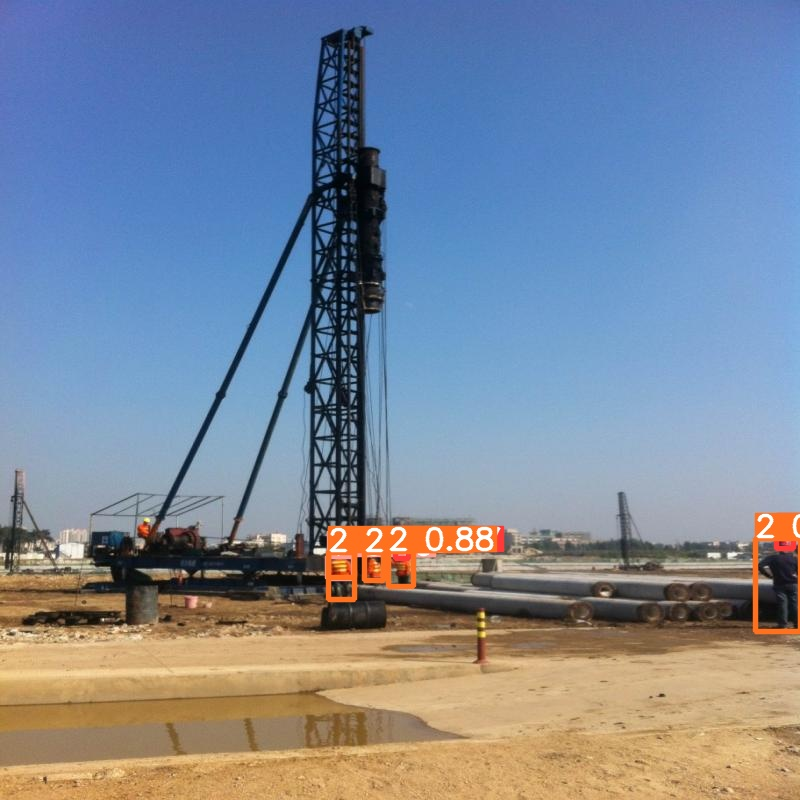

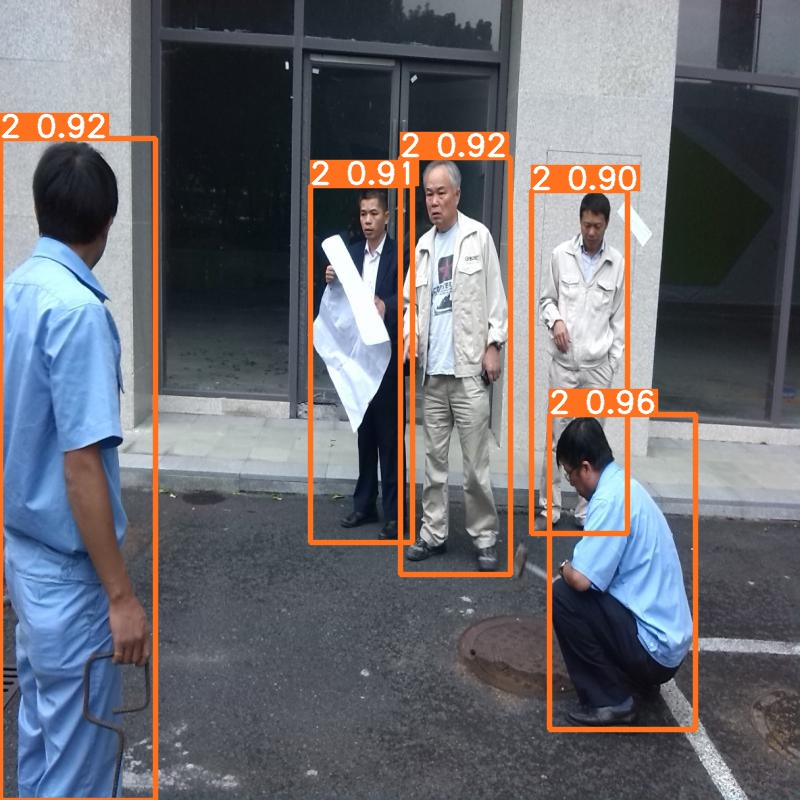

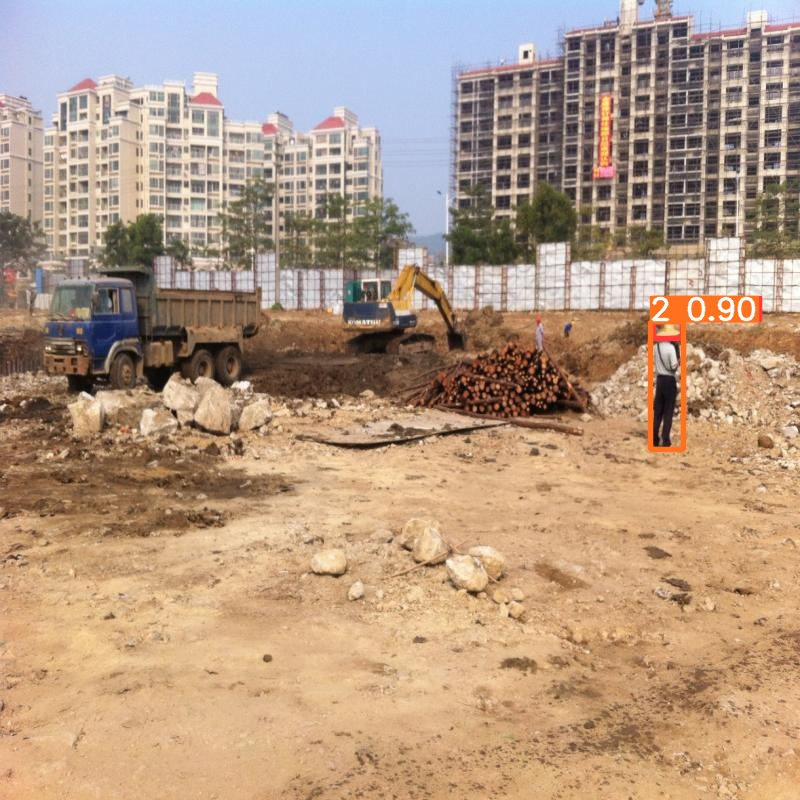

In [30]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/predict/*.jpg')[:10]:
      display(Image(filename=image_path, width=600))
      print("\n")

In [25]:
!zip -r /content/results.zip /content/runs/detect

  adding: content/runs/detect/ (stored 0%)
  adding: content/runs/detect/val/ (stored 0%)
  adding: content/runs/detect/val/val_batch0_pred.jpg (deflated 6%)
  adding: content/runs/detect/val/P_curve.png (deflated 12%)
  adding: content/runs/detect/val/val_batch2_labels.jpg (deflated 5%)
  adding: content/runs/detect/val/val_batch1_labels.jpg (deflated 8%)
  adding: content/runs/detect/val/F1_curve.png (deflated 9%)
  adding: content/runs/detect/val/PR_curve.png (deflated 11%)
  adding: content/runs/detect/val/val_batch2_pred.jpg (deflated 5%)
  adding: content/runs/detect/val/val_batch1_pred.jpg (deflated 7%)
  adding: content/runs/detect/val/R_curve.png (deflated 10%)
  adding: content/runs/detect/val/val_batch0_labels.jpg (deflated 6%)
  adding: content/runs/detect/val/confusion_matrix.png (deflated 32%)
  adding: content/runs/detect/train3/ (stored 0%)
  adding: content/runs/detect/train3/val_batch0_pred.jpg (deflated 5%)
  adding: content/runs/detect/train3/weights/ (stored 0%)
  

In [26]:
from google.colab import files
files.download("/content/results.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [27]:
#---Final---